In [1]:
import numpy as np
import pandas as pd
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import os
import scipy.stats as ss
import seaborn as sns

In [2]:
#Create a file name list assigning to 2 groups
filelist = {}
directory_p = "/Users/mike_data_analysis/Documents/projects/STORM_imaging/STORM_data/tstorm/csvdata_crop/"
key_d = [1,2]
for i in key_d:
    directory_sub = directory_p + str(i)
    filelist[i] = os.listdir(directory_sub)

In [3]:
#Concatinate Channel 1 or Channel 2 datasets
frame_w = []
frame_k = []
for j in list(range(len(filelist[1]))):
    filename = directory_p + "1/" + filelist[1][j]
    if "w" in filename:
        df_sub_w = pd.read_csv(filename)
        df_sub_w['File_name'] = filelist[1][j]
        frame_w.append(df_sub_w)

    elif "k" in filename:
        df_sub_k = pd.read_csv(filename)
        df_sub_k['File_name'] = filelist[1][j]
        frame_k.append(df_sub_k)
df_result_w = pd.concat(frame_w)
df_result_k = pd.concat(frame_k)

In [26]:
#To normalize 'intensity[photon]', find out the minimum and maximum of all files within each channel
group1min = []
group1max = []
for j in range(len(filelist[1])):
    filename = directory_p + "1/" + filelist[1][j]
    subfile = pd.read_csv(filename)['intensity [photon]']
    mean = np.mean(subfile)
    std = np.std(subfile)
    prehis = (subfile - mean)/std
    minimum = min(prehis)
    maximum = max(prehis)
    group1min += [minimum]
    group1max += [maximum]
group1_min = min(group1min)
group1_max = max(group1max)

group2min = []
group2max = []
for j in range(len(filelist[2])):
    filename = directory_p + "2/" + filelist[2][j]
    subfile = pd.read_csv(filename)['intensity [photon]']
    mean = np.mean(subfile)
    std = np.std(subfile)
    prehis = (subfile - mean)/std
    minimum = min(prehis)
    maximum = max(prehis)
    group2min += [minimum]
    group2max += [maximum]
group2_min = min(group2min)
group2_max = max(group2max)

In [6]:
import os
def NormalizeHis(folderpath):
    #folderpath: the directory of the folder including all data file list of each channel 
    #Find out file name list
    #import os
    
    filelist = os.listdir(folderpath)
    
    #Find out maximum and minimum value to constraint the scale of histogram
    groupmaxlist = []
    groupminlist = []
    for j in range(len(filelist)):
        filename = folderpath + filelist[j]
        subfile = pd.read_csv(filename)['intensity [photon]']
        mean = np.mean(subfile)
        std = np.std(subfile)
        prehis = (subfile - mean)/std
        minimum = min(prehis)
        maximum = max(prehis)
        groupminlist += [minimum]
        groupmaxlist += [maximum]
    group_min = min(groupminlist)
    group_max = max(groupmaxlist)
    
    #Plot histograms using normalized data for all the files inside the folder
    for j in range(len(filelist)):
        filename = folderpath + filelist[j]
        subfile = pd.read_csv(filename)['intensity [photon]']
        mean = np.mean(subfile)
        std = np.std(subfile)
        prehis = (subfile - mean)/std
        list_min = int(group_min)
        list_max = int(group_max)
        binsize = 1
        bins = list(range(list_min, list_max, binsize))
        plt.hist(prehis, bins= bins, facecolor='blue', alpha=0.6)
        plt.title(filelist[j])
        plt.yscale('log')
        plt.show()
    return
    

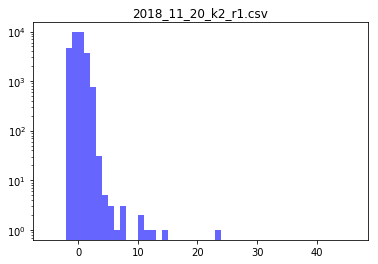

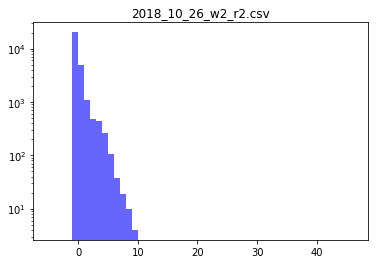

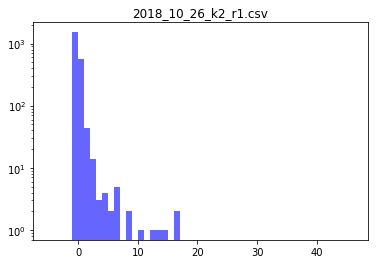

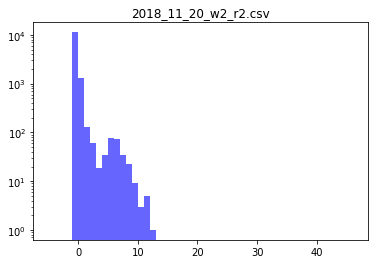

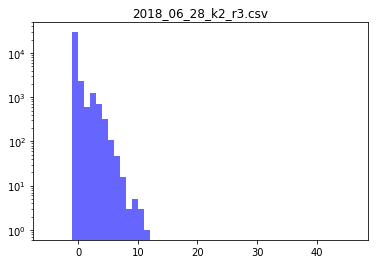

...

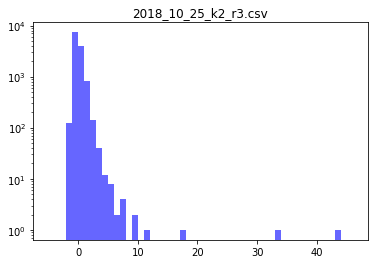

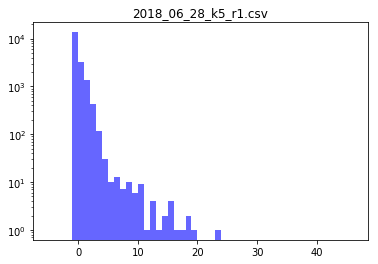

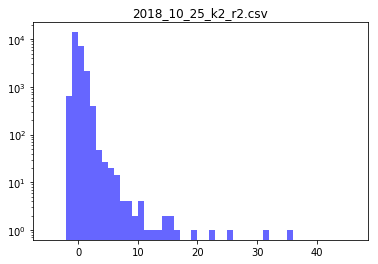

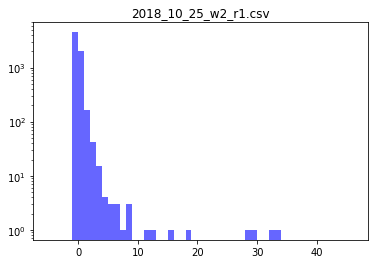

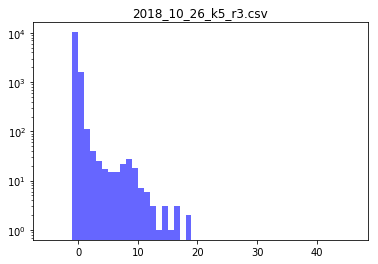

In [7]:
NormalizeHis("/Users/mike_data_analysis/Documents/projects/STORM_imaging/STORM_data/tstorm/csvdata_crop/1/")

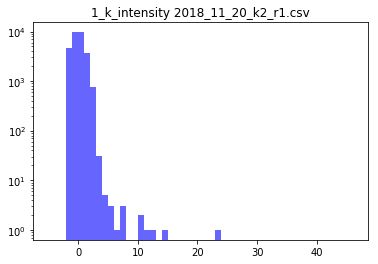

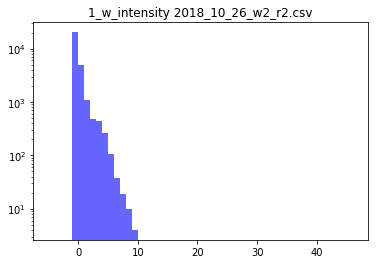

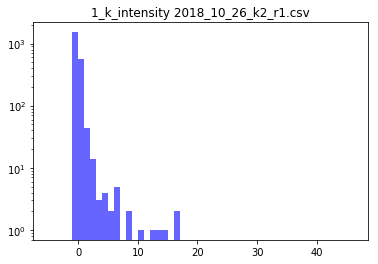

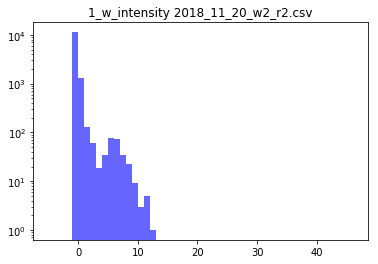

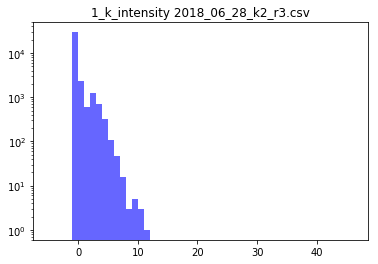

...

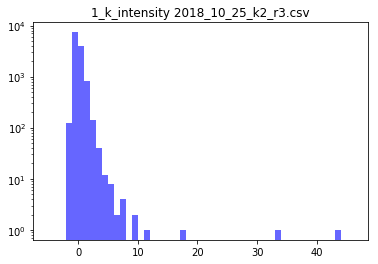

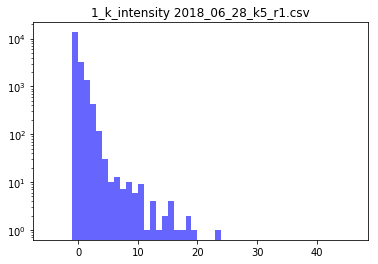

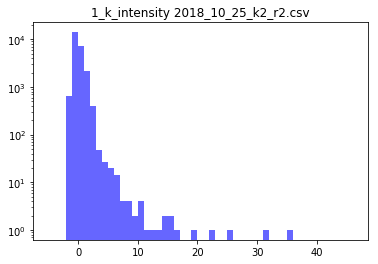

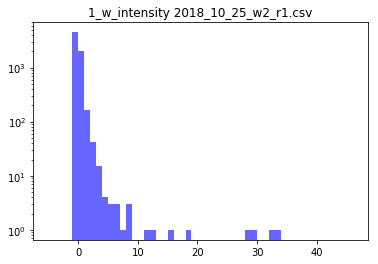

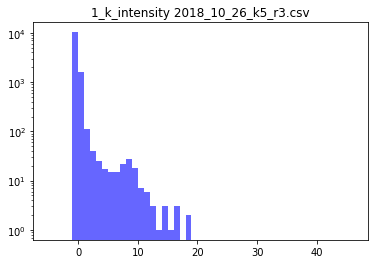

In [38]:
#Normalize intensity variable and plot histogram for each file of Channel 1
for j in list(range(len(filelist[1]))):
    filename = directory_p + "1/" + filelist[1][j]
    if "w" in filename:
        subfile = pd.read_csv(filename)['intensity [photon]']
        mean = np.mean(subfile)
        std = np.std(subfile)
        prehis = (subfile - mean)/std
        list_min = int(group1_min)
        list_max = int(group1_max)
        binsize = 1
        bins = list(range(list_min, list_max, binsize))
        plt.hist(prehis, bins= bins, facecolor='blue', alpha=0.6)
        plt.title('1_w_intensity '+ str(filelist[1][j])) 
        plt.yscale('log')
        plt.show()

    elif "k" in filename:
        subfile = pd.read_csv(filename)['intensity [photon]']
        mean = np.mean(subfile)
        std = np.std(subfile)
        prehis = (subfile - mean)/std
        list_min = int(group1_min)
        list_max = int(group1_max)
        binsize = 1
        bins = list(range(list_min, list_max, binsize))
        plt.hist(prehis, bins= bins, facecolor='blue', alpha=0.6)
        plt.title('1_k_intensity '+ str(filelist[1][j])) 
        plt.yscale('log')
        plt.show()

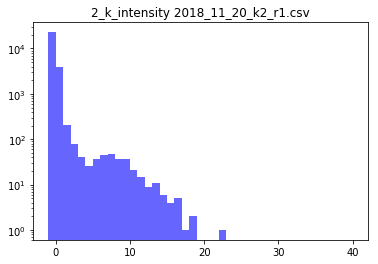

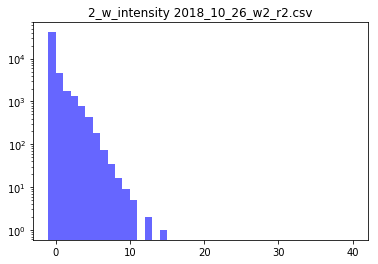

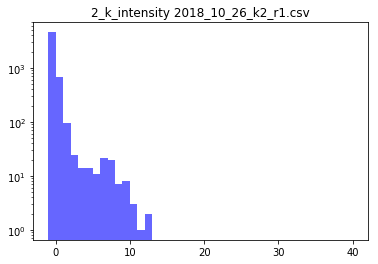

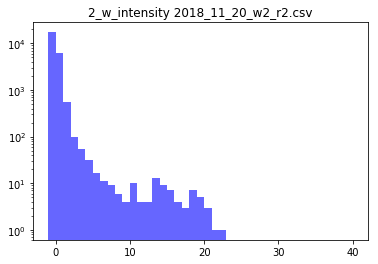

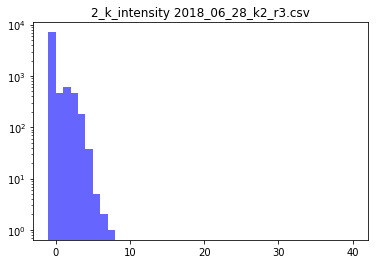

...

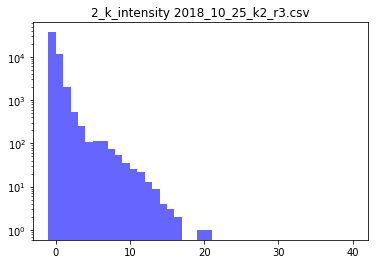

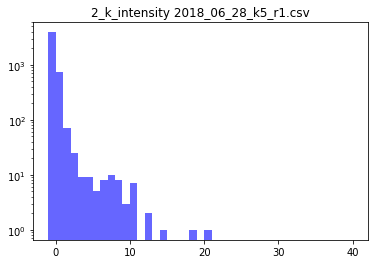

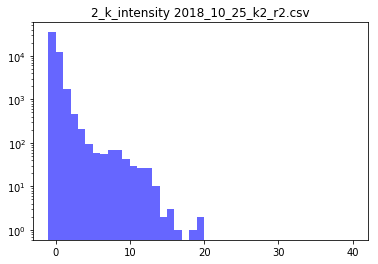

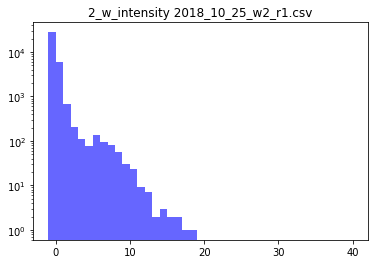

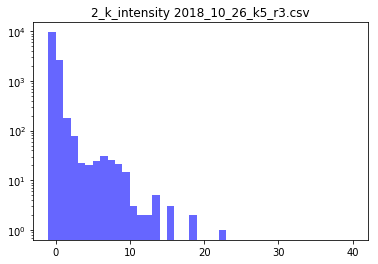

In [39]:
#Normalize intensity variable and plot histogram for each file of Channel 2
for j in list(range(len(filelist[2]))):
    filename = directory_p + "2/" + filelist[2][j]
    if "w" in filename:
        subfile = pd.read_csv(filename)['intensity [photon]']
        mean = np.mean(subfile)
        std = np.std(subfile)
        prehis = (subfile - mean)/std
        list_min = int(group2_min)
        list_max = int(group2_max)
        binsize = 1
        bins = list(range(list_min, list_max, binsize))
        plt.hist(prehis, bins= bins, facecolor='blue', alpha=0.6)
        plt.title('2_w_intensity '+ str(filelist[2][j])) 
        plt.yscale('log')
        plt.show()

    elif "k" in filename:
        subfile = pd.read_csv(filename)['intensity [photon]']
        mean = np.mean(subfile)
        std = np.std(subfile)
        prehis = (subfile - mean)/std
        list_min = int(group2_min)
        list_max = int(group2_max)
        binsize = 1
        bins = list(range(list_min, list_max, binsize))
        plt.hist(prehis, bins= bins, facecolor='blue', alpha=0.6)
        plt.title('2_k_intensity '+ str(filelist[2][j])) 
        plt.yscale('log')
        plt.show()

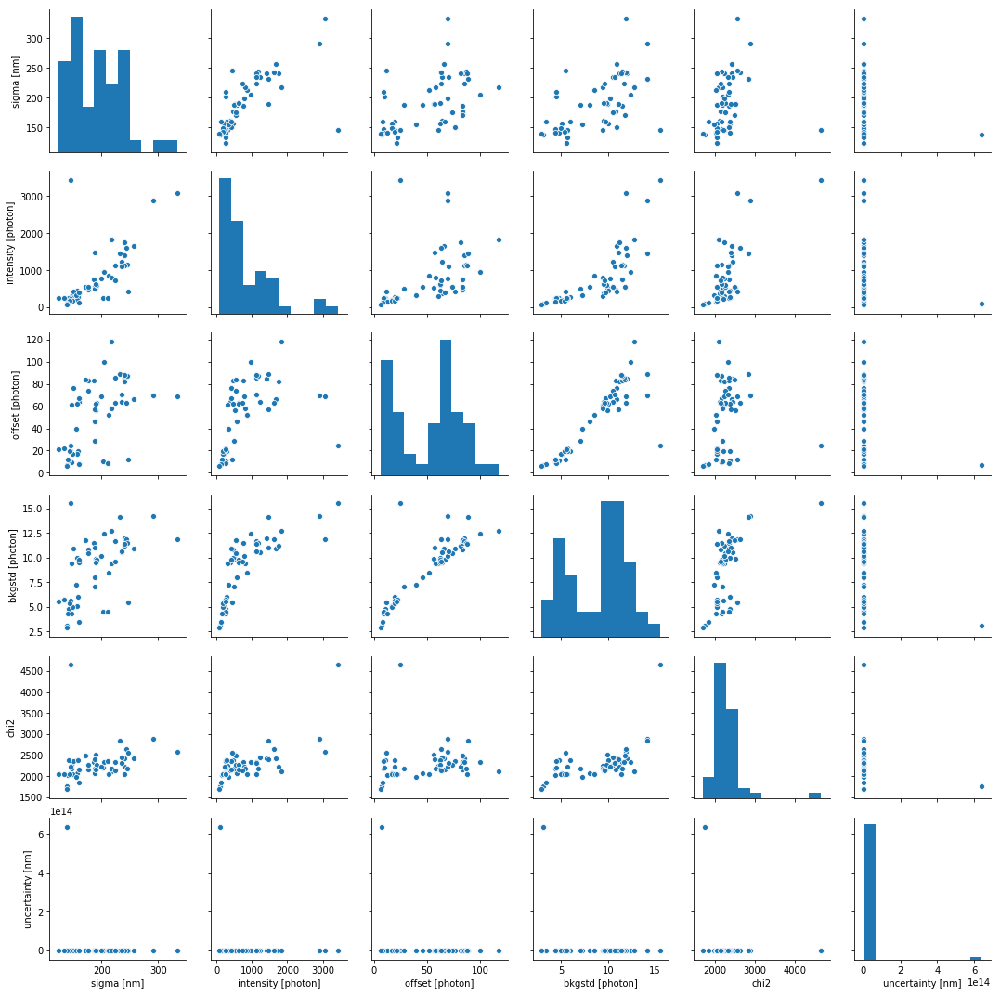

In [6]:
#Pair plot for Channel 1w using Seaborn
w1 = df_result_w.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]']]
sns.pairplot(data=w1)

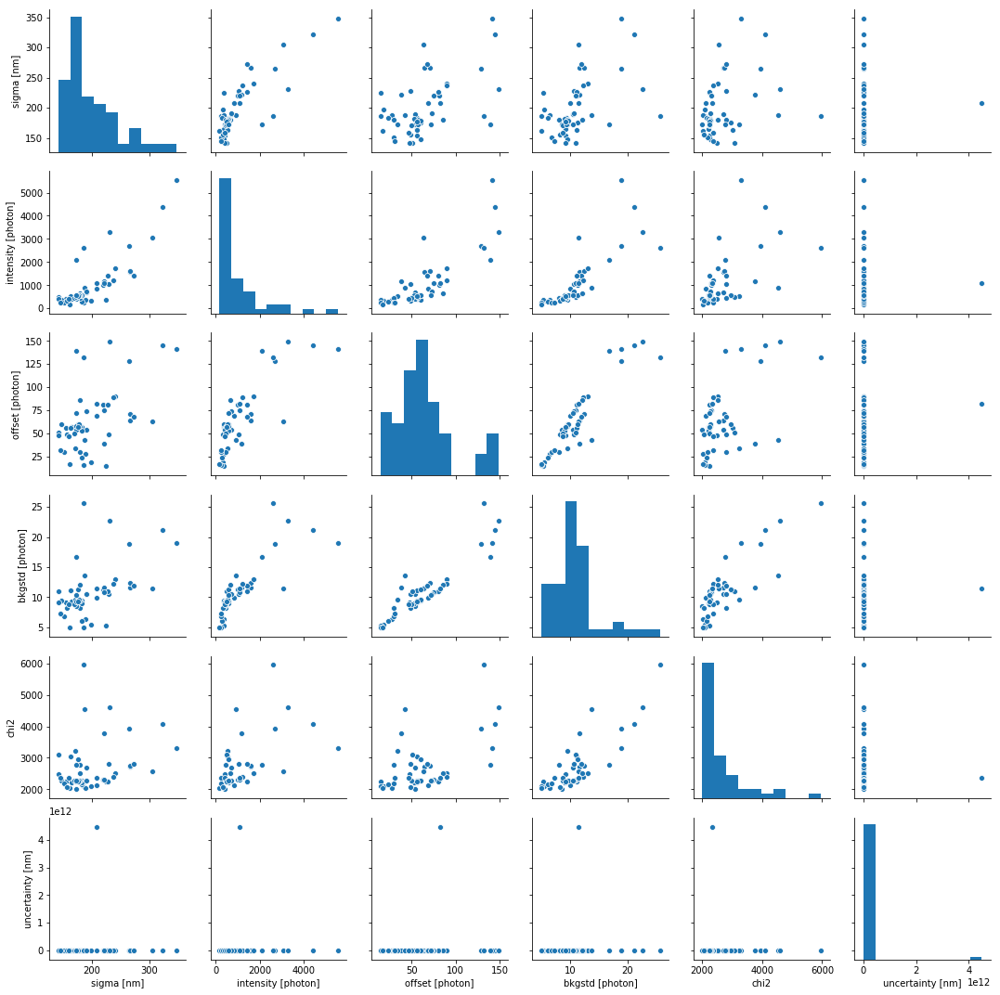

In [263]:
#Pair plot for Channel 1k using Seaborn
k1 = df_result_k.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]']]
sns.pairplot(data=k1)

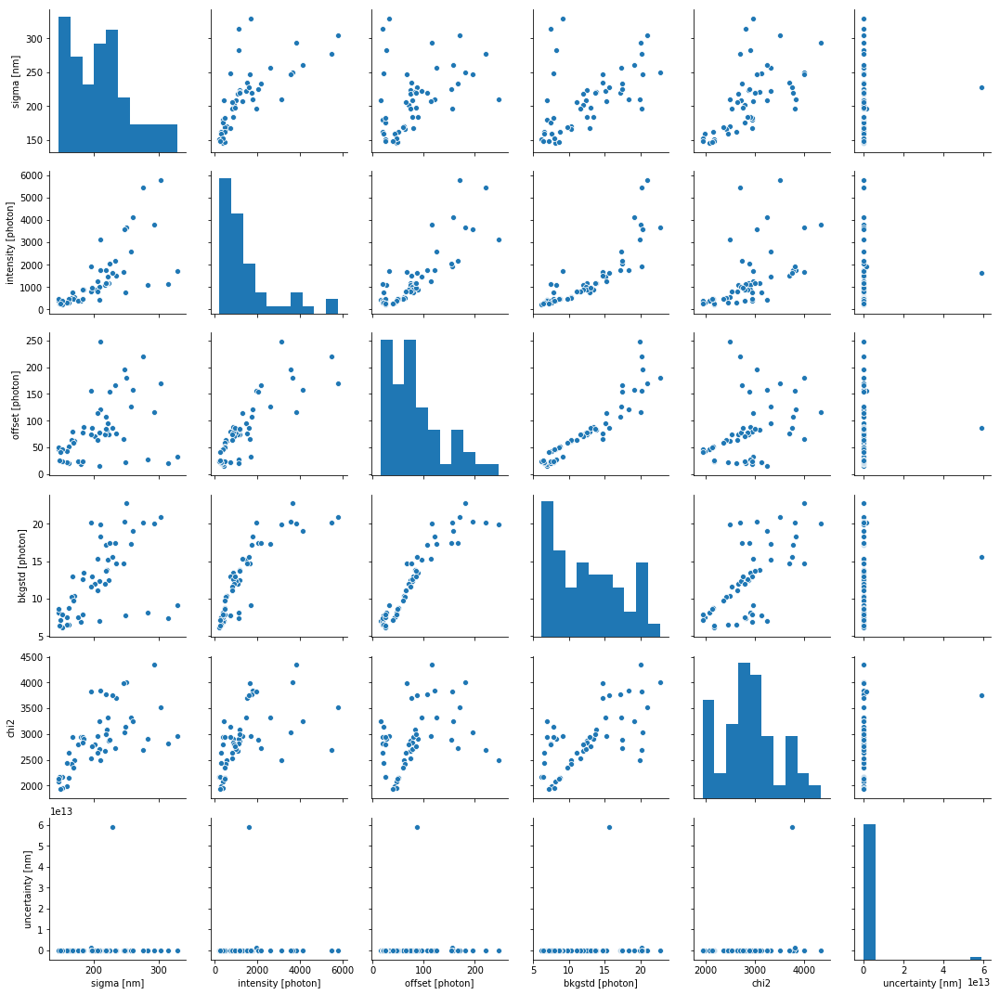

In [264]:
#Pair plot for Channel 2w using Seaborn
w2 = df_result_w1.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]']]
sns.pairplot(data=w2)

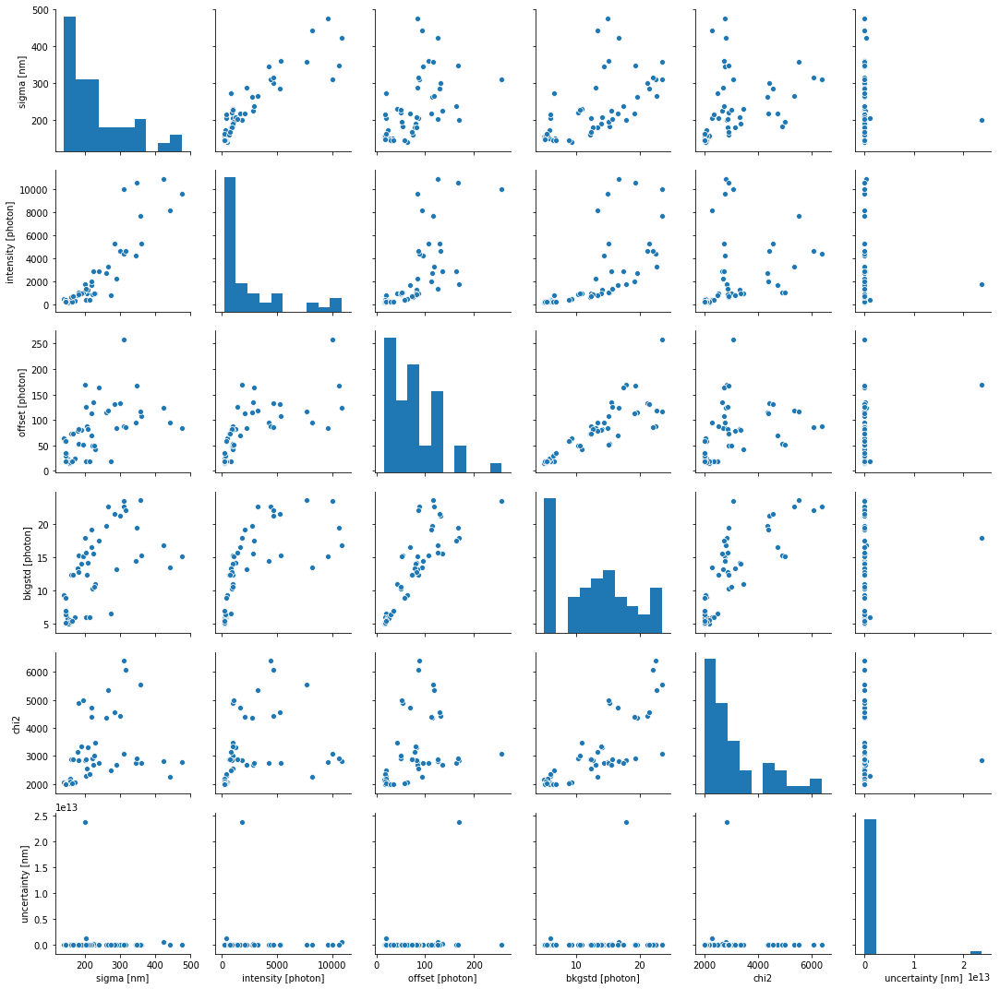

In [265]:
#Pair plot for Channel 2k using Seaborn
k2 = df_result_k1.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]']]
sns.pairplot(data=k2)

In [220]:
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
import copy
py.sign_in('AriaRen','AtiibfXGar8FRpQvhnzD')

In [303]:
#Plotly pairplot for 1-w
classes=np.unique(df_result_w[['File_name']].values).tolist()
df_result_w = df_result_w.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]','File_name']]
class_code={classes[k]: k for k in range(len(classes))}
color_vals=[class_code[cl] for cl in df_result_w['File_name']]
pl_colorscale=[[0.0, '#19d3f3'],
               [0.333, '#19d3f3'],
               [0.333, '#e763fa'],
               [0.666, '#e763fa'],
               [0.666, '#636efa'],
               [1, '#636efa']]
text=[df_result_w.loc[ k, 'File_name'] for k in range(len(df_result_w))]
trace1 = go.Splom(dimensions=[dict(label='sigma [nm]',
                                 values=df_result_w['sigma [nm]']),
                            dict(label='intensity [photon]',
                                 values=df_result_w['intensity [photon]']),
                            dict(label='offset [photon]',
                                 values=df_result_w['offset [photon]']),
                            dict(label='bkgstd [photon]',
                                 values=df_result_w['bkgstd [photon]']),
                            dict(label='chi2',
                                 values=df_result_w['chi2']),
                            dict(label='uncertainty [nm]',
                                 values=df_result_w['uncertainty [nm]'])],
                text=text,
                #default axes name assignment :
                #xaxes= ['x1','x2',  'x3'],
                #yaxes=  ['y1', 'y2', 'y3'], 
                marker=dict(color=color_vals,
                            size=7,
                            colorscale=pl_colorscale,
                            showscale=False,
                            line=dict(width=0.5,
                                      color='rgb(230,230,230)'))
                )
axis = dict(showline=True,
          zeroline=False,
          gridcolor='#fff',
          ticklen=6)
layout = go.Layout(
    title='Plot-w1',
    dragmode='select',
    width=1000,
    height=1000,
    autosize=False,
    hovermode='closest',
    plot_bgcolor='rgba(240,240,240, 0.95)',
    xaxis1=dict(axis),
    xaxis2=dict(axis),
    xaxis3=dict(axis),
    xaxis4=dict(axis),
    xaxis5=dict(axis),
    xaxis6=dict(axis),
    yaxis1=dict(axis),
    yaxis2=dict(axis),
    yaxis3=dict(axis),
    yaxis4=dict(axis),
    yaxis5=dict(axis),
    yaxis6=dict(axis)
)
fig1 = dict(data=[trace1], layout=layout)
py.iplot(fig1)

/Users/mike_data_analysis/anaconda3/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [306]:
#Plotly pairplot for 1-k
classes=np.unique(df_result_k[['File_name']].values).tolist()
df_result_k = df_result_k.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]','File_name']]
class_code={classes[k]: k for k in range(len(classes))}
color_vals=[class_code[cl] for cl in df_result_k['File_name']]
pl_colorscale=[[0.0, '#19d3f3'],
               [0.333, '#19d3f3'],
               [0.333, '#e763fa'],
               [0.666, '#e763fa'],
               [0.666, '#636efa'],
               [1, '#636efa']]
text=[df_result_k.loc[ k, 'File_name'] for k in range(len(df_result_k))]
trace1 = go.Splom(dimensions=[dict(label='sigma [nm]',
                                 values=df_result_k['sigma [nm]']),
                            dict(label='intensity [photon]',
                                 values=df_result_k['intensity [photon]']),
                            dict(label='offset [photon]',
                                 values=df_result_k['offset [photon]']),
                            dict(label='bkgstd [photon]',
                                 values=df_result_k['bkgstd [photon]']),
                            dict(label='chi2',
                                 values=df_result_k['chi2']),
                            dict(label='uncertainty [nm]',
                                 values=df_result_k['uncertainty [nm]'])],
                text=text,
                #default axes name assignment :
                #xaxes= ['x1','x2',  'x3'],
                #yaxes=  ['y1', 'y2', 'y3'], 
                marker=dict(color=color_vals,
                            size=7,
                            colorscale=pl_colorscale,
                            showscale=False,
                            line=dict(width=0.5,
                                      color='rgb(230,230,230)'))
                )
axis = dict(showline=True,
          zeroline=False,
          gridcolor='#fff',
          ticklen=6)
layout = go.Layout(
    title='Plot-k1',
    dragmode='select',
    width=1000,
    height=1000,
    autosize=False,
    hovermode='closest',
    plot_bgcolor='rgba(240,240,240, 0.95)',
    xaxis1=dict(axis),
    xaxis2=dict(axis),
    xaxis3=dict(axis),
    xaxis4=dict(axis),
    xaxis5=dict(axis),
    xaxis6=dict(axis),
    yaxis1=dict(axis),
    yaxis2=dict(axis),
    yaxis3=dict(axis),
    yaxis4=dict(axis),
    yaxis5=dict(axis),
    yaxis6=dict(axis)
)
fig1 = dict(data=[trace1], layout=layout)
py.iplot(fig1)

/Users/mike_data_analysis/anaconda3/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [308]:
#Plotly pairplot for 2-w
classes=np.unique(df_result_w1[['File_name']].values).tolist()
df_result_w1 = df_result_w1.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]','File_name']]
class_code={classes[k]: k for k in range(len(classes))}
color_vals=[class_code[cl] for cl in df_result_w1['File_name']]
pl_colorscale=[[0.0, '#19d3f3'],
               [0.333, '#19d3f3'],
               [0.333, '#e763fa'],
               [0.666, '#e763fa'],
               [0.666, '#636efa'],
               [1, '#636efa']]
text=[df_result_w1.loc[ k, 'File_name'] for k in range(len(df_result_w1))]
trace1 = go.Splom(dimensions=[dict(label='sigma [nm]',
                                 values=df_result_w1['sigma [nm]']),
                            dict(label='intensity [photon]',
                                 values=df_result_w1['intensity [photon]']),
                            dict(label='offset [photon]',
                                 values=df_result_w1['offset [photon]']),
                            dict(label='bkgstd [photon]',
                                 values=df_result_w1['bkgstd [photon]']),
                            dict(label='chi2',
                                 values=df_result_w1['chi2']),
                            dict(label='uncertainty [nm]',
                                 values=df_result_w1['uncertainty [nm]'])],
                text=text,
                #default axes name assignment :
                #xaxes= ['x1','x2',  'x3'],
                #yaxes=  ['y1', 'y2', 'y3'], 
                marker=dict(color=color_vals,
                            size=7,
                            colorscale=pl_colorscale,
                            showscale=False,
                            line=dict(width=0.5,
                                      color='rgb(230,230,230)'))
                )
axis = dict(showline=True,
          zeroline=False,
          gridcolor='#fff',
          ticklen=6)
layout = go.Layout(
    title='Plot-w2',
    dragmode='select',
    width=1000,
    height=1000,
    autosize=False,
    hovermode='closest',
    plot_bgcolor='rgba(240,240,240, 0.95)',
    xaxis1=dict(axis),
    xaxis2=dict(axis),
    xaxis3=dict(axis),
    xaxis4=dict(axis),
    xaxis5=dict(axis),
    xaxis6=dict(axis),
    yaxis1=dict(axis),
    yaxis2=dict(axis),
    yaxis3=dict(axis),
    yaxis4=dict(axis),
    yaxis5=dict(axis),
    yaxis6=dict(axis)
)
fig1 = dict(data=[trace1], layout=layout)
py.iplot(fig1)

/Users/mike_data_analysis/anaconda3/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [309]:
#Plotly pairplot for 2-k
classes=np.unique(df_result_k1[['File_name']].values).tolist()
df_result_k1 = df_result_k1.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]','File_name']]
class_code={classes[k]: k for k in range(len(classes))}
color_vals=[class_code[cl] for cl in df_result_k1['File_name']]
pl_colorscale=[[0.0, '#19d3f3'],
               [0.333, '#19d3f3'],
               [0.333, '#e763fa'],
               [0.666, '#e763fa'],
               [0.666, '#636efa'],
               [1, '#636efa']]
text=[df_result_k1.loc[ k, 'File_name'] for k in range(len(df_result_k1))]
trace1 = go.Splom(dimensions=[dict(label='sigma [nm]',
                                 values=df_result_k1['sigma [nm]']),
                            dict(label='intensity [photon]',
                                 values=df_result_k1['intensity [photon]']),
                            dict(label='offset [photon]',
                                 values=df_result_k1['offset [photon]']),
                            dict(label='bkgstd [photon]',
                                 values=df_result_k1['bkgstd [photon]']),
                            dict(label='chi2',
                                 values=df_result_k1['chi2']),
                            dict(label='uncertainty [nm]',
                                 values=df_result_k1['uncertainty [nm]'])],
                text=text,
                #default axes name assignment :
                #xaxes= ['x1','x2',  'x3'],
                #yaxes=  ['y1', 'y2', 'y3'], 
                marker=dict(color=color_vals,
                            size=7,
                            colorscale=pl_colorscale,
                            showscale=False,
                            line=dict(width=0.5,
                                      color='rgb(230,230,230)'))
                )
axis = dict(showline=True,
          zeroline=False,
          gridcolor='#fff',
          ticklen=6)
layout = go.Layout(
    title='Plot-k2',
    dragmode='select',
    width=1000,
    height=1000,
    autosize=False,
    hovermode='closest',
    plot_bgcolor='rgba(240,240,240, 0.95)',
    xaxis1=dict(axis),
    xaxis2=dict(axis),
    xaxis3=dict(axis),
    xaxis4=dict(axis),
    xaxis5=dict(axis),
    xaxis6=dict(axis),
    yaxis1=dict(axis),
    yaxis2=dict(axis),
    yaxis3=dict(axis),
    yaxis4=dict(axis),
    yaxis5=dict(axis),
    yaxis6=dict(axis)
)
fig1 = dict(data=[trace1], layout=layout)
py.iplot(fig1)

/Users/mike_data_analysis/anaconda3/lib/python3.7/site-packages/IPython/core/display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



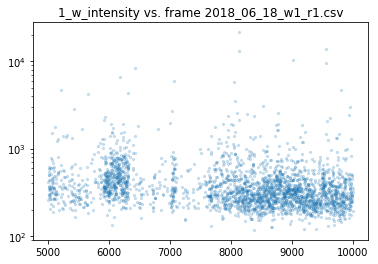

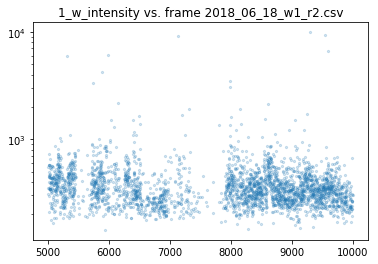

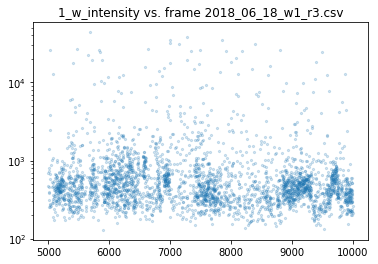

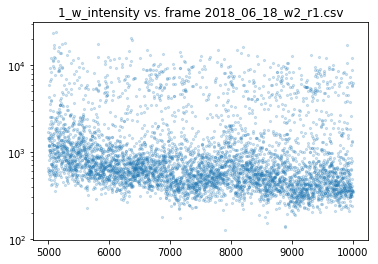

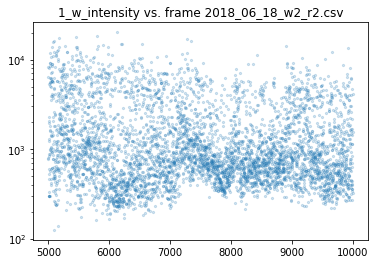

...

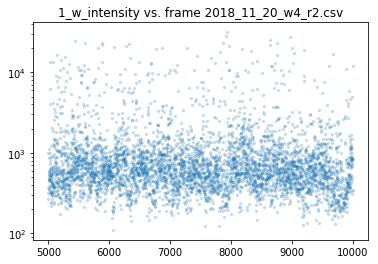

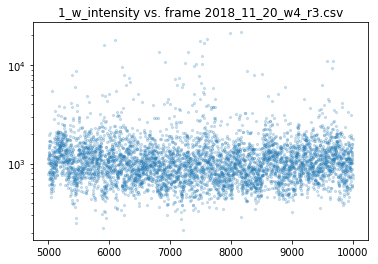

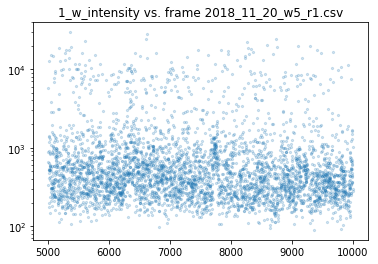

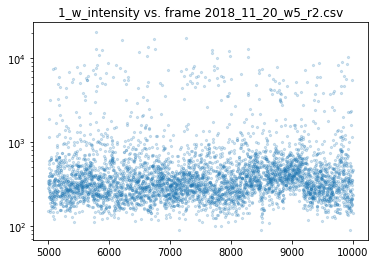

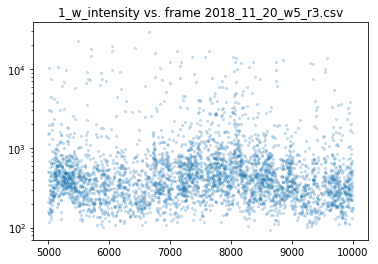

In [176]:
#Intensity vs. frame Group1
for j in list(range(len(filelist[1]))):
    filename = directory_p + "1/" + filelist[1][j]
    if "w" in filename:
        df_a = pd.read_csv(filename)
        df_a = df_a.groupby(by = 'frame', as_index = False).mean().loc[list(range(0, 5000)),:]
        plt.scatter(x = df_a['frame'], y = df_a['intensity [photon]'], s = 5, alpha = 0.2)
        plt.title('1_w_intensity vs. frame '+ str(filelist[1][j]))
        plt.yscale('log')
        filepath = directory_p + "Plot_collection/" + str(filelist[1][j] + '_1.jpg')
        plt.savefig(filepath)
        plt.show()
    if "k" in filename:
        df_b = pd.read_csv(filename)
        df_b = df_b.groupby(by = 'frame', as_index = False).mean().loc[list(range(0, 5000)),:]
        plt.scatter(x = df_b['frame'], y = df_b['intensity [photon]'], s = 5, alpha = 0.2)
        plt.title('1_k_intensity vs. frame '+ str(filelist[1][j])) 
        plt.yscale('log')
        filepath = directory_p + "Plot_collection/" + str(filelist[1][j] + '_1.jpg')
        plt.savefig(filepath)
        plt.show()

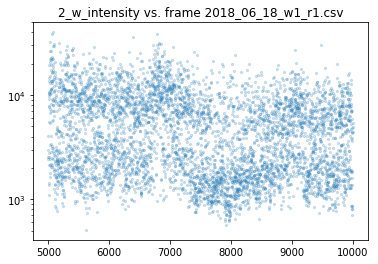

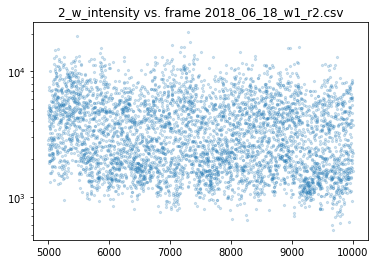

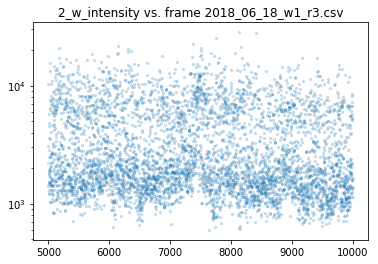

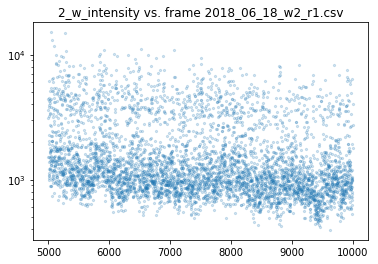

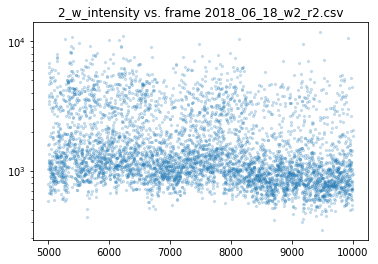

...

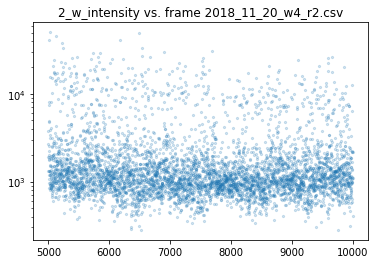

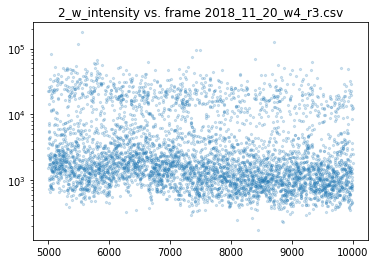

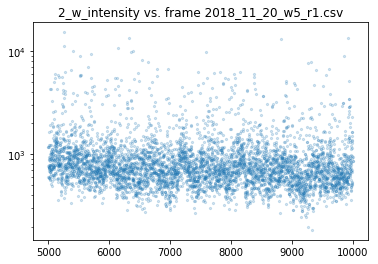

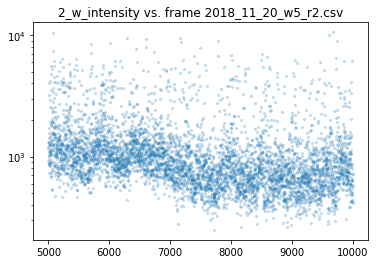

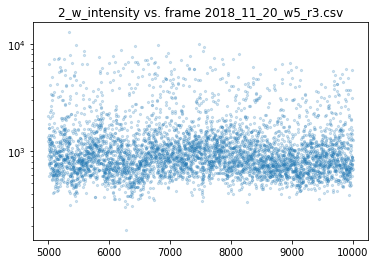

In [177]:
#Intensity vs. frame Group2
for j in list(range(len(filelist[2]))):
    filename = directory_p + "2/" + filelist[1][j]
    if "w" in filename:
        df_sub_w = pd.read_csv(filename)
        df_a = df_sub_w.groupby(by = 'frame', as_index = False).mean().loc[list(range(0, 5000)),:]
        plt.scatter(x = df_a['frame'], y = df_a['intensity [photon]'], s = 5, alpha = 0.2)
        plt.title('2_w_intensity vs. frame '+ str(filelist[2][j]))
        plt.yscale('log')
        filepath = directory_p + "Plot_collection/" + str(filelist[2][j] + '_2.jpg')
        plt.savefig(filepath)
        plt.show()
    if "k" in filename:
        df_sub_k = pd.read_csv(filename)
        df_b = df_sub_k.groupby(by = 'frame', as_index = False).mean().loc[list(range(0, 5000)),:]
        plt.scatter(x = df_b['frame'], y = df_b['intensity [photon]'], s = 5, alpha = 0.2)
        plt.title('2_k_intensity vs. frame '+ str(filelist[2][j])) 
        plt.yscale('log')
        filepath = directory_p + "Plot_collection/" + str(filelist[2][j] + '_2.jpg')
        plt.savefig(filepath)
        plt.show()

Text(0.5, 1.0, 'w_intensity vs. frame')

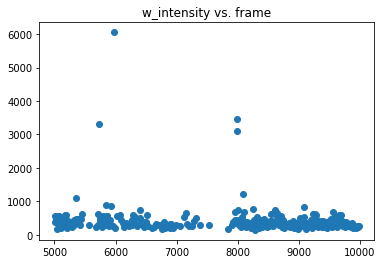

In [109]:
#sub = list(range(0, 5000, 50))
df = pd.read_csv(directory_p + "1/" + filelist[1][1])
df_a = df.groupby(by = 'frame', as_index = False).mean().loc[list(range(0, 5000, 10)),:]
#df_a = df_result_w.groupby(by = 'frame', as_index = False).mean().loc[list(range(0, 5000, 10)),:]
plt.scatter(x = df_a['frame'], y = df_a['intensity [photon]'])
#['intensity [photon]'].plot.scatter()
plt.title('w_intensity vs. frame')

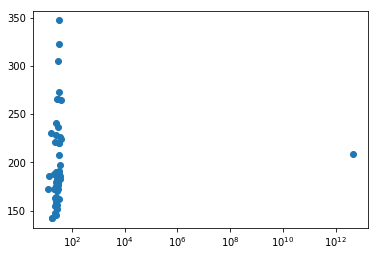

In [9]:
p1 = df_result_k.groupby(by = 'File_name', as_index = False).mean()\
[['sigma [nm]','intensity [photon]','offset [photon]','bkgstd [photon]','chi2','uncertainty [nm]']]
plt.scatter(x = p1['uncertainty [nm]'], y = p1['sigma [nm]'])
plt.xscale('log')


In [13]:
frame_temp1 = []
for j in list(range(len(filelist[2]))):
    filename = directory_p + "2/" + filelist[2][j]
    df_sub = pd.read_csv(filename)
    df_sub['File_name'] = filelist[2][j]
    # frames = [frames, df_sub]
    frame_temp1.append(df_sub)
df_result1 = pd.concat(frame_temp1)

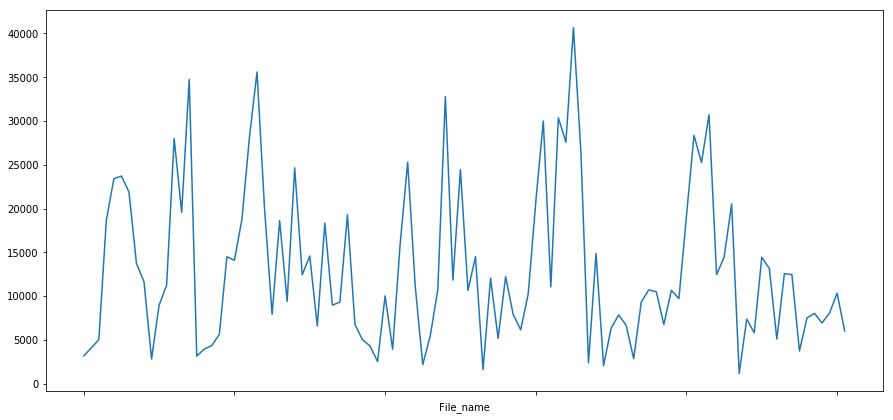

In [90]:
#count by filename
fig, ax = plt.subplots(figsize=(15,7))
df_result.groupby(by = 'File_name').count()['intensity [photon]'].plot()
plt.show()

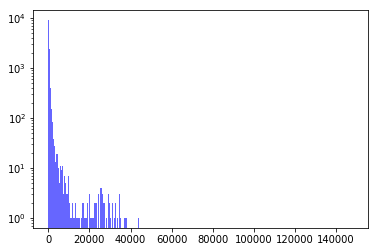

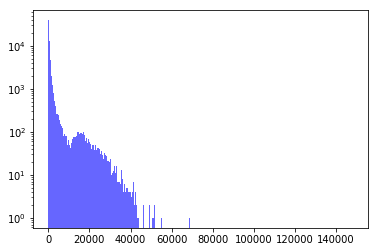

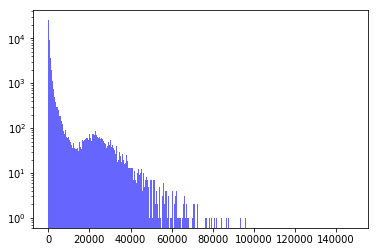

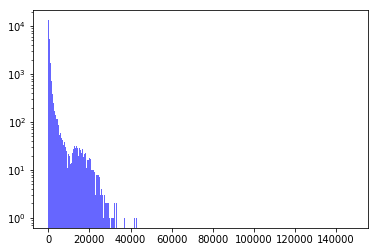

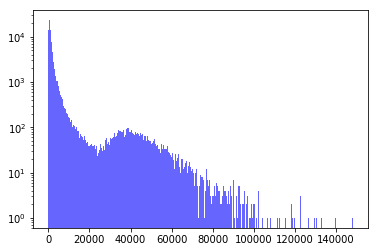

...

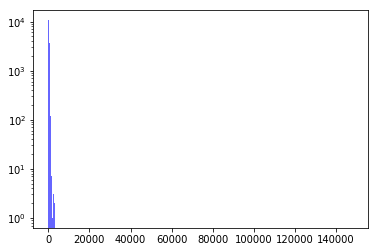

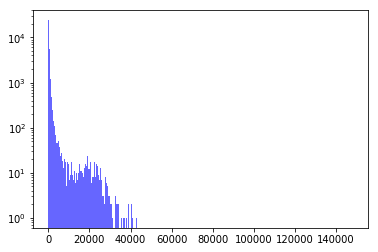

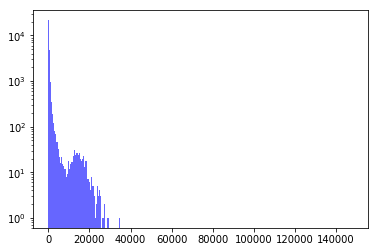

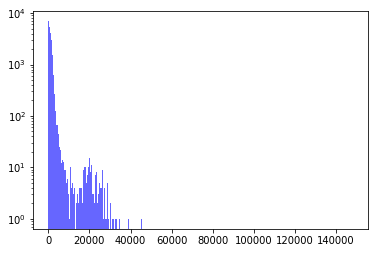

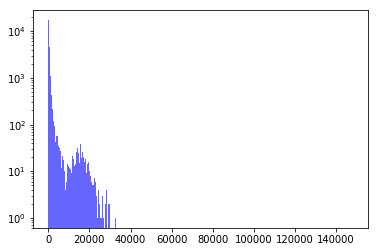

In [11]:
for i in range(len(filelist)):
    #filename = directory + filelist[i]
    if i%3 == 0:
        df_a = pd.read_csv(directory + filelist[i])['intensity [photon]']
        df_b = pd.read_csv(directory + filelist[i+1])['intensity [photon]']
        df_c = pd.read_csv(directory + filelist[i+2])['intensity [photon]']
        df_new = pd.concat([df_a, df_b])
        df_new1 = pd.concat([df_new, df_c])
        list_min = 0
        list_max = int(maxint)
        binsize = 500
        bins = list(range(list_min, list_max + binsize, binsize))
        plt.hist(df_new1, bins= bins, facecolor='blue', alpha=0.6)
        plt.yscale('log')
        plt.show()

/Users/mike_data_analysis/anaconda3/lib/python3.7/site-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


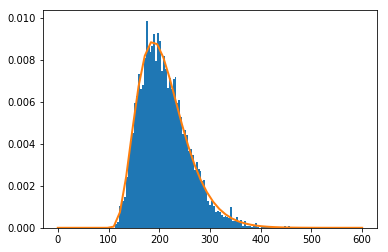

In [10]:
alpha, loc, beta=5, 100, 22
data=ss.gamma.rvs(alpha,loc=loc,scale=beta,size=5000)
myHist = plt.hist(data, 100, normed=True)
rv = ss.gamma(alpha,loc,beta)
x = np.linspace(0,600) 
h = plt.plot(x, rv.pdf(x), lw=2)
plt.show()

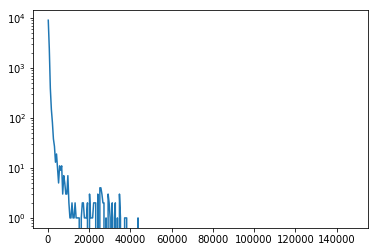

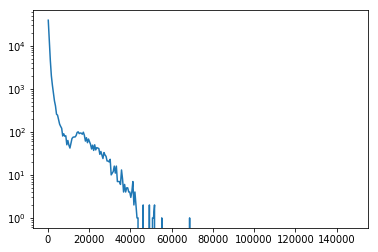

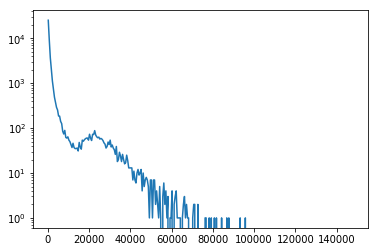

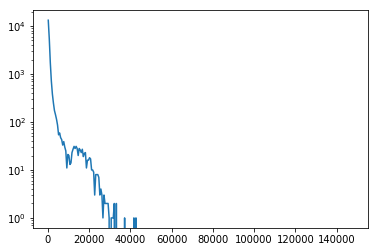

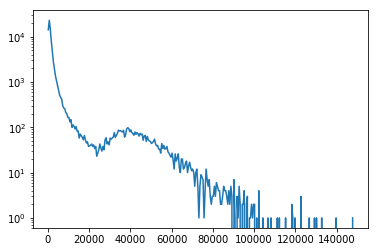

...

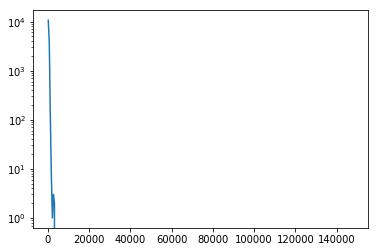

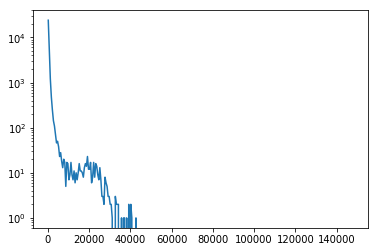

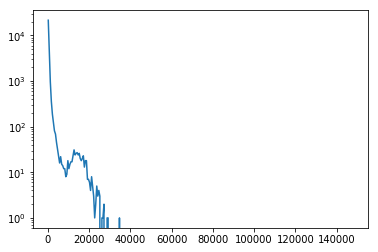

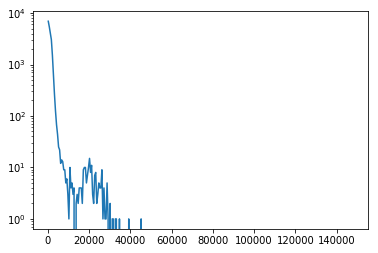

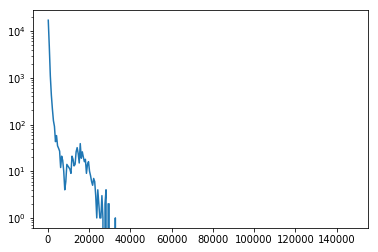

In [15]:
for i in range(len(filelist)):
    #filename = directory + filelist[i]
    if i%3 == 0:
        df_a = pd.read_csv(directory + filelist[i])['intensity [photon]']
        df_b = pd.read_csv(directory + filelist[i+1])['intensity [photon]']
        df_c = pd.read_csv(directory + filelist[i+2])['intensity [photon]']
        df_new = pd.concat([df_a, df_b])
        df_new1 = pd.concat([df_new, df_c])
        list_min = 0
        list_max = int(maxint)
        binsize = 500
        bins = list(range(list_min, list_max + binsize, binsize))
        #plt.hist(df_new1, bins= bins, facecolor='blue', alpha=0.6)
        y,binEdges=np.histogram(df_new1,bins=bins)
        bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
        plt.plot(bincenters,y,'-')
        plt.yscale('log')
        plt.show()
        